# Name: Sambhav Agrawal Roll No. 19264  Data Science and Engineering

# Installing Covid Module


In [1]:
!pip install covid
!pip install cufflinks

# Importing Useful Libraries 

In [2]:
from covid import Covid
import plotly as py
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.express as px
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

plt.rcParams['figure.figsize'] = 12,8


import cufflinks as cf
cf.go_offline()
import warnings
warnings.filterwarnings('ignore')

In [3]:
covid = Covid(source="worldometers")
covid1 = Covid(source="john_hopkins")
df = pd.DataFrame(covid.get_data())
df                                                          # df dataframe for worldometers
jh = pd.DataFrame(covid1.get_data())                        # jh dataframe for john hopkins

# CMap for the Dataset for better visualisation

In [4]:
df.style.background_gradient(cmap='Reds')

,country,total_cases,confirmed,new_cases,deaths,new_deaths,recovered,active,active_cases,critical,total_tests,total_tests_per_million,total_cases_per_million,total_deaths_per_million,population
0,North America,56189834,56189834,11288,1147034,392,44806787,10236013,10236013,19568,0,0,0,0,0
1,Asia,79267784,79267784,82360,1169909,1684,76321463,1776412,1776412,26940,0,0,0,0,0
2,South America,38389806,38389806,2142,1169971,14,36549924,669911,669911,12335,0,0,0,0,0
3,Europe,64322809,64322809,221251,1299829,2841,57930643,5092337,5092337,13198,0,0,0,0,0
4,Africa,8567512,8567512,657,218535,21,7903124,445853,445853,2264,0,0,0,0,0
5,Oceania,308526,308526,1789,3699,14,251921,52906,52906,324,0,0,0,0,0
6,0,721,721,0,15,0,706,0,0,0,0,0,0,0,0
7,World,247046992,247046992,319487,5008992,4966,223764568,18273432,18273432,74629,0,0,31694,642.6,0
8,USA,46776345,46776345,4366,765757,35,36646900,9363688,9363688,12716,697847798,0,140227,2296,333574837
9,India,34272260,34272260,12541,458213,440,33647055,166992,166992,8944,607062619,0,24516,328,1397976093


In [5]:
df = df.drop(['total_tests_per_million'], axis = 1)
df

,country,total_cases,confirmed,new_cases,deaths,new_deaths,recovered,active,active_cases,critical,total_tests,total_cases_per_million,total_deaths_per_million,population
0,North America,56189834,56189834,11288,1147034,392,44806787,10236013,10236013,19568,0,0,0,0
1,Asia,79267784,79267784,82360,1169909,1684,76321463,1776412,1776412,26940,0,0,0,0
2,South America,38389806,38389806,2142,1169971,14,36549924,669911,669911,12335,0,0,0,0
3,Europe,64322809,64322809,221251,1299829,2841,57930643,5092337,5092337,13198,0,0,0,0
4,Africa,8567512,8567512,657,218535,21,7903124,445853,445853,2264,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,Marshall Islands,4,4,0,0,0,4,0,0,0,0,67,0,59719
227,Samoa,3,3,0,0,0,3,0,0,0,0,15,0,200161
228,Saint Helena,2,2,0,0,0,2,0,0,0,0,328,0,6101
229,Micronesia,1,1,0,0,0,1,0,0,0,0,9,0,116620


In [6]:
df_1 = df[['total_cases', 'confirmed', 'new_cases','deaths', 'new_deaths', 'recovered', 'active', 'critical', 'total_tests', 'total_cases_per_million','total_deaths_per_million', 'population']]
df_1.head()

,total_cases,confirmed,new_cases,deaths,new_deaths,recovered,active,critical,total_tests,total_cases_per_million,total_deaths_per_million,population
0,56189834,56189834,11288,1147034,392,44806787,10236013,19568,0,0,0,0
1,79267784,79267784,82360,1169909,1684,76321463,1776412,26940,0,0,0,0
2,38389806,38389806,2142,1169971,14,36549924,669911,12335,0,0,0,0
3,64322809,64322809,221251,1299829,2841,57930643,5092337,13198,0,0,0,0
4,8567512,8567512,657,218535,21,7903124,445853,2264,0,0,0,0


In [7]:
df_1.corr()

,total_cases,confirmed,new_cases,deaths,new_deaths,recovered,active,critical,total_tests
total_cases,1.000000,1.000000,0.888631,0.991257,0.912105,0.999159,0.901259,0.992344,0.179066
confirmed,1.000000,1.000000,0.888631,0.991257,0.912105,0.999159,0.901259,0.992344,0.179066
new_cases,0.888631,0.888631,1.000000,0.880664,0.980292,0.890944,0.768441,0.849930,0.058414
deaths,0.991257,0.991257,0.880664,1.000000,0.901109,0.989651,0.895197,0.985142,0.135126
new_deaths,0.912105,0.912105,0.980292,0.901109,1.000000,0.915473,0.778646,0.888505,0.064361
recovered,0.999159,0.999159,0.890944,0.989651,0.915473,1.000000,0.883164,0.991788,0.169695
active,0.901259,0.901259,0.768441,0.895197,0.778646,0.883164,1.000000,0.890802,0.271103
critical,0.992344,0.992344,0.849930,0.985142,0.888505,0.991788,0.890802,1.000000,0.146495
total_tests,0.179066,0.179066,0.058414,0.135126,0.064361,0.169695,0.271103,0.146495,1.000000


#  Correlation Matrix

<AxesSubplot:>

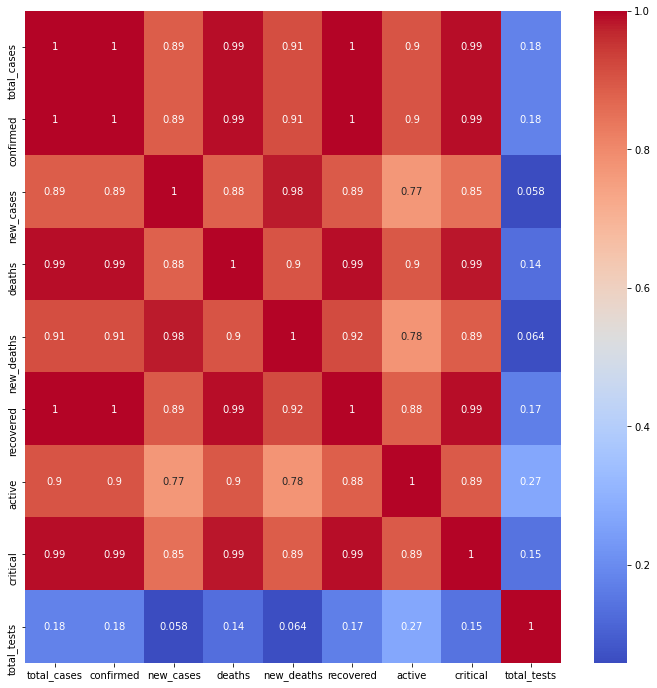

In [8]:
plt.figure(figsize=(12,12))
sns.heatmap(df_1.corr(), annot= True, cmap='coolwarm')

# Daywise Covid 19 Dataset from https://ourworldindata.org/

In [9]:
#Here I am also using this dataset from ourworldindata as they give day wise data which can be visualised excellently. So as to make the exploration and visualisation better I an also using thsi dataset along with John Hopkins and worldometers.
daywise = pd.read_csv('daywise.csv')                     # daywise dataframe for ourworldindata

In [10]:
daywise.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125094 entries, 0 to 125093
Data columns (total 4 columns):
 #   Column                                 Non-Null Count   Dtype 
---  ------                                 --------------   ----- 
 0   Country                                125094 non-null  object
 1   Code                                   114864 non-null  object
 2   Date                                   125094 non-null  object
 3   Daily new confirmed cases of COVID-19  125094 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 3.8+ MB


In [11]:
df.describe()

,total_cases,confirmed,new_cases,deaths,new_deaths,recovered,active,active_cases,critical,total_tests
count,2.310000e+02,2.310000e+02,231.000000,2.310000e+02,231.000000,2.310000e+02,2.310000e+02,2.310000e+02,231.000000,2.310000e+02
mean,3.208402e+06,3.208402e+06,4149.181818,6.505184e+04,64.493506,2.898584e+06,2.360002e+05,2.360002e+05,969.207792,1.717826e+07
std,1.843619e+07,1.843619e+07,26349.766976,3.696424e+05,401.990632,1.669374e+07,1.542928e+06,1.542928e+06,5589.161502,6.830645e+07
min,1.000000e+00,1.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
25%,1.339100e+04,1.339100e+04,0.000000,1.660000e+02,0.000000,6.793000e+03,2.965000e+02,2.965000e+02,0.000000,1.429540e+05
50%,1.184270e+05,1.184270e+05,0.000000,1.707000e+03,0.000000,8.895200e+04,4.644000e+03,4.644000e+03,10.000000,1.199169e+06
75%,5.981910e+05,5.981910e+05,556.000000,1.129600e+04,7.000000,5.250075e+05,3.211600e+04,3.211600e+04,196.000000,7.453897e+06
max,2.470470e+08,2.470470e+08,319487.000000,5.008992e+06,4966.000000,2.237646e+08,1.827343e+07,1.827343e+07,74629.000000,6.978478e+08


In [12]:
india_data = covid.get_status_by_country_name("india")
india_data

{'country': 'India',
 'total_cases': 34272260,
 'confirmed': 34272260,
 'new_cases': 12541,
 'deaths': 458213,
 'new_deaths': 440,
 'recovered': 33647055,
 'active': 166992,
 'active_cases': 166992,
 'critical': 8944,
 'total_tests': 607062619,
 'total_tests_per_million': Decimal('0'),
 'total_cases_per_million': Decimal('24516'),
 'total_deaths_per_million': Decimal('328'),
 'population': Decimal('1397976093')}

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231 entries, 0 to 230
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   country                   231 non-null    object
 1   total_cases               231 non-null    int64 
 2   confirmed                 231 non-null    int64 
 3   new_cases                 231 non-null    int64 
 4   deaths                    231 non-null    int64 
 5   new_deaths                231 non-null    int64 
 6   recovered                 231 non-null    int64 
 7   active                    231 non-null    int64 
 8   active_cases              231 non-null    int64 
 9   critical                  231 non-null    int64 
 10  total_tests               231 non-null    int64 
 11  total_cases_per_million   231 non-null    object
 12  total_deaths_per_million  231 non-null    object
 13  population                231 non-null    object
dtypes: int64(10), object(4)
me

# Visualisation using Matplotlib 

Text(0, 0.5, 'Number of deaths')

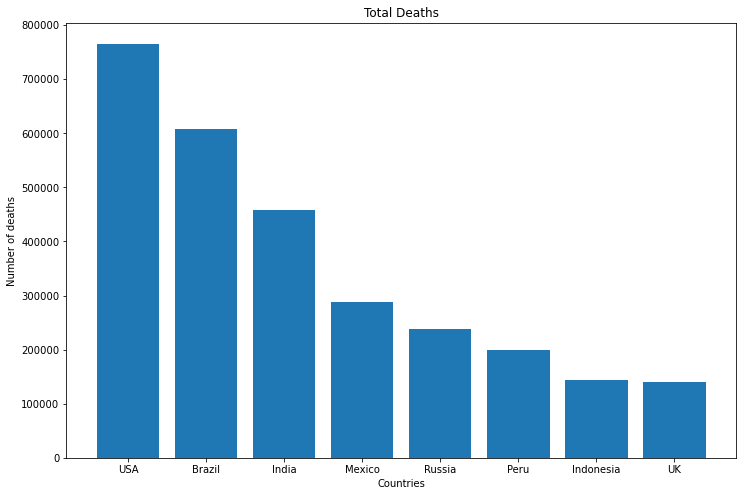

In [14]:
df_1 = df[8:].sort_values(by='deaths',ascending=False)[0:8].reset_index()
plt.bar(df_1['country'], df_1['deaths'], )
plt.title("Total Deaths")
plt.xlabel("Countries")
plt.ylabel("Number of deaths")

# Pie Charts using Plotly


In [15]:
fig = px.pie(df[0:6], values='confirmed', names='country', title='Confirmed Cases', color_discrete_sequence =px.colors.qualitative.G10)
fig.update_traces(textposition='inside', textinfo='label')
fig.show()

In [16]:
fig = px.pie(df[8:], values='confirmed', names='country', title='Confirmed Cases', color_discrete_sequence =px.colors.qualitative.G10)
fig.update_traces(textposition='inside', textinfo='label')
fig.show()

# Scatter Plot

In [17]:
# scatter-plot
df_1 = df[8:].sort_values(by='total_cases',ascending=False)[0:20].reset_index()
df_1 = pd.DataFrame(df_1.groupby('country')['total_cases'].sum())

fig = px.scatter(df_1, x = df_1.index, y = 'total_cases', size = 'total_cases', color_discrete_sequence =px.colors.qualitative.G10, color = df_1.index)

fig.show()

In [18]:
df_1 = df[8:].sort_values(by='confirmed',ascending=False)[0:20].reset_index()
df_1 = pd.DataFrame(df_1.groupby('country')['confirmed'].sum())

fig = px.scatter(df_1, x = df_1.index, y = 'confirmed', size = 'confirmed', color_discrete_sequence =px.colors.qualitative.G10, color = df_1.index)

fig.show()

In [19]:
df_1 = df[8:].sort_values(by='recovered',ascending=False)[0:20].reset_index()
df_1 = pd.DataFrame(df_1.groupby('country')['recovered'].sum())

fig = px.scatter(df_1, x = df_1.index, y = 'recovered', size = 'recovered', color = df_1.index, color_discrete_sequence =px.colors.qualitative.G10)

fig.show()

# Bar Plots

In [20]:
# bar-plot
df_1 = df[8:].sort_values(by='total_cases',ascending=False)[0:20].reset_index()
fig = px.bar(df_1, x=['total_cases'], y='country', labels={'value': 'total_cases'},barmode='overlay', opacity=1,color_discrete_sequence =px.colors.qualitative.G10,color='country')
fig.show()

In [21]:
# bar-plot
df_1 = df[8:].sort_values(by='confirmed',ascending=False)[0:20].reset_index()
fig = px.bar(df_1, x=['confirmed'], y='country', labels={'value': 'confirmed'},barmode='overlay', opacity=1,color_discrete_sequence =px.colors.qualitative.G10,color='country')
fig.show()

In [22]:
# bar-plot
df_1 = df[8:].sort_values(by='recovered',ascending=False)[0:20].reset_index()
fig = px.bar(df_1, x=['recovered'], y='country', labels={'value': 'recovered'},barmode='overlay', opacity=1,color='country', color_discrete_sequence =px.colors.qualitative.G10)
fig.show()

In [23]:
df_1 = df[8:].sort_values(by='new_cases',ascending=False)[0:20].reset_index()
fig = px.bar(df_1, x=['new_cases'], y='country', labels={'value': 'New Cases'},barmode='overlay', opacity=1,color='country', color_discrete_sequence =px.colors.qualitative.G10)
fig.show()

In [24]:
df_1 = df[8:].sort_values(by='active_cases',ascending=False)[0:20].reset_index()
fig = px.bar(df_1, x=['active_cases'], y='country', labels={'value': 'Active Cases'},barmode='overlay', opacity=1,color='country', color_discrete_sequence =px.colors.qualitative.G10)
fig.show()

In [25]:
df_1 = df.sort_values(by='total_tests',ascending=False)[0:20].reset_index()
fig = px.bar(df_1, x=['total_tests'], y='country', labels={'value': 'tests'},barmode='overlay', opacity=1,color='country', color_discrete_sequence =px.colors.qualitative.G10)
fig.show()

In [26]:
df_1 = df[8:].sort_values(by='deaths',ascending=False)[0:20].reset_index()
fig = px.bar(df_1, x=['deaths'], y='country', labels={'value': 'deaths'},barmode='overlay', opacity=1,color='country', color_discrete_sequence =px.colors.qualitative.G10)
fig.show()

In [27]:
df_1 = df.sort_values(by='total_deaths_per_million',ascending=False)[0:20].reset_index()
df_1.iplot(kind='scatter', x = 'country', y = 'total_deaths_per_million', title = 'Total Deaths per Million', mode = 'markers+lines')


# Visualising Total Cases with Choropleth Map (Color Value is in log scale for better visualisation)

In [28]:
fig = px.choropleth(df,locations='country', color=np.log(df['total_cases']), locationmode='country names', color_continuous_scale=px.colors.sequential.Turbo)
fig.show()

In [29]:
fig = px.choropleth(daywise,locations='Country', color = np.log(daywise["Daily new confirmed cases of COVID-19"]), animation_frame="Date", locationmode='country names', color_continuous_scale=px.colors.sequential.PuRd)
fig.show()

# Tree Map Analysis

In [30]:
fig = px.treemap(df[8:].sort_values(by = 'total_cases', ascending = False).reset_index(drop = True),
                path = ['country'], values = 'total_cases',
                title = 'Total Number of Cases',
                color_discrete_sequence = px.colors.qualitative.Dark2)


fig.data[0].textinfo = 'label+text+value'
fig.show()

In [31]:
fig = px.treemap(df[8:].sort_values(by = 'deaths', ascending = False).reset_index(drop = True),
                path = ['country'], values = 'deaths',
                title = 'Total Number of Deaths',
                color_discrete_sequence = px.colors.qualitative.Dark2)


fig.data[0].textinfo = 'label+text+value'
fig.show()

In [32]:
fig = px.density_mapbox(jh, lat = 'latitude', lon = 'longitude', hover_name = 'country', hover_data = ['confirmed','deaths'], radius = 6, zoom = 0)
fig.update_layout(title = 'Covid-19 Confirmed Cases and Deaths uptill now')
fig.update_layout(mapbox_style = 'open-street-map', mapbox_center_lon = 0)
fig.show()

In [33]:
total_cases = df.total_cases[7]

deaths = df.deaths[7]

recovered = df.recovered[7]

active = df.active[7]

# World Covid-19 Stats Dashboard

In [34]:
fig = go.Figure()
fig.add_trace(go.Indicator(
    mode='number', value=total_cases,
    title={"text":"Total Confirmed Cases"},
    domain={"row":0, "column":0}
))

fig.add_trace(go.Indicator(
    mode='number', value=recovered,
    title={"text":"Total Recovered"},
    domain={"row":0, "column":1}
))

fig.add_trace(go.Indicator(
    mode='number', value=deaths,
    title={"text":"Total Deaths"},
    domain={"row":1, "column":0}
))

fig.add_trace(go.Indicator(
    mode='number', value=active,
    title={"text":"Total Active Cases"},
    domain={"row":1, "column":1}
))
fig.update_layout(grid={'rows': 2, 'columns': 2, 'pattern': 'independent' })
fig.show()